<a href="https://colab.research.google.com/github/arishp/veltech_genai/blob/main/Stable_diffusion_basics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Wed Apr  3 20:50:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install diffusers==0.11.1
!pip install -q transformers ftfy accelerate bitsandbytes==0.35.0 safetensors xformers scipy

In [3]:
import torch
from diffusers import StableDiffusionPipeline

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)

In [5]:
pipe = pipe.to('cuda')

In [6]:
pipe.enable_attention_slicing()
pipe.enable_xformers_memory_efficient_attention()

  0%|          | 0/50 [00:00<?, ?it/s]

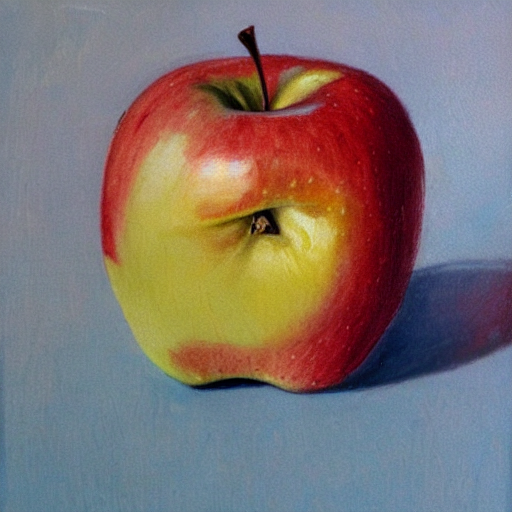

In [7]:
prompt = "an apple"
img = pipe(prompt).images[0]
img

In [ ]:
img.save('result.png')

  0%|          | 0/50 [00:00<?, ?it/s]

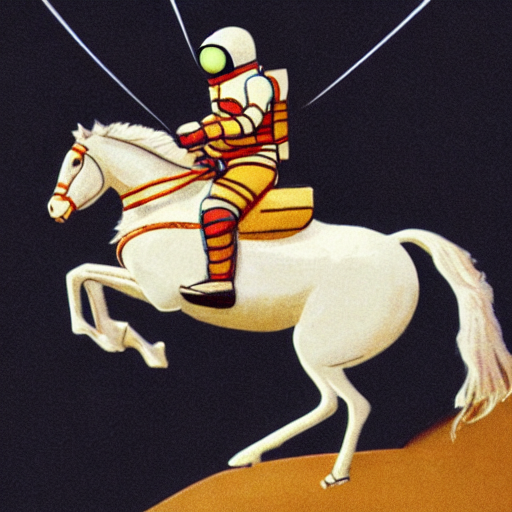

In [8]:
prompt = "a photograph of an astronaut riding a horse"
img = pipe(prompt).images[0]
img

In [9]:
img.size

(512, 512)

# Generating multiple images

In [10]:
from PIL import Image

def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows*cols
  w, h = imgs[0].size
  w, h = int(w*scale), int(h*scale)
  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size
  for i, img in enumerate(imgs):
    img = img.resize((w, h), Image.ANTIALIAS)
    grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

  0%|          | 0/50 [00:00<?, ?it/s]

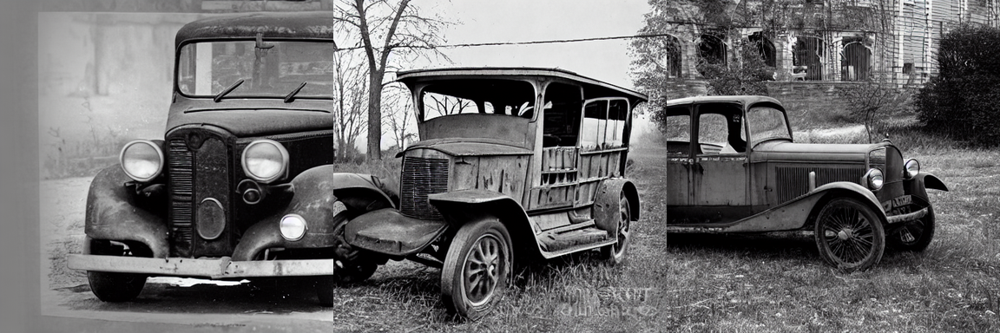

In [12]:
num_imgs = 3
prompt = "photograph of an old car"
imgs = pipe(prompt=prompt, num_images_per_prompt=num_imgs).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

# Parameter: Seed

  0%|          | 0/50 [00:00<?, ?it/s]

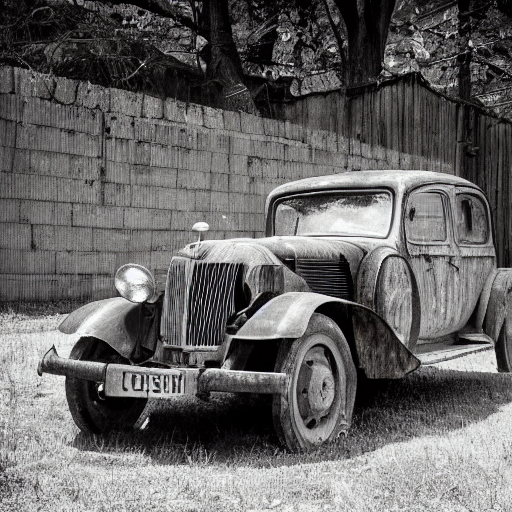

In [13]:
seed = 777
generator = torch.Generator('cuda').manual_seed(seed)
img = pipe(prompt=prompt, generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

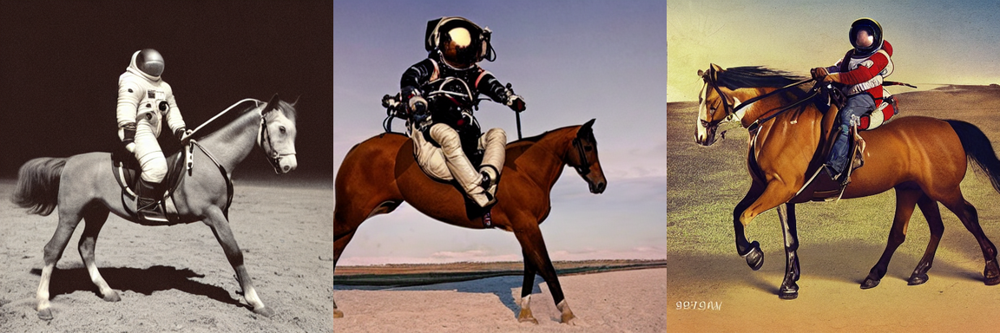

In [15]:
prompt = "photograph of an astronaut riding a horse"
seed = 777
generator = torch.Generator('cuda').manual_seed(seed)
num_imgs = 3
imgs = pipe(prompt=prompt, num_images_per_prompt=num_imgs, generator=generator).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

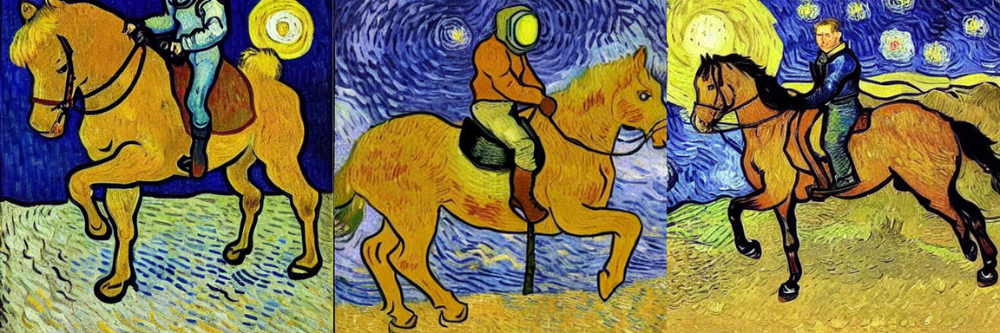

In [16]:
prompt = "van gogh painting of an astronaut riding a horse"
seed = 777
generator = torch.Generator('cuda').manual_seed(seed)
num_imgs = 3
imgs = pipe(prompt=prompt, num_images_per_prompt=num_imgs, generator=generator).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

# Parameters: inference steps
preferred value: 50

  0%|          | 0/20 [00:00<?, ?it/s]

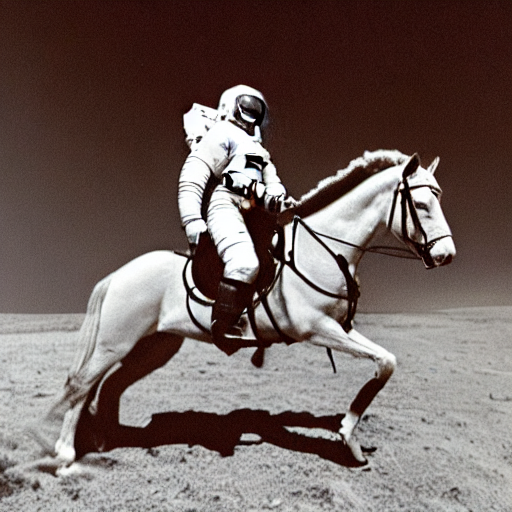

In [17]:
prompt = "a photograph of an astronaut riding a horse"
seed = 777
generator = torch.Generator('cuda').manual_seed(seed)
img = pipe(prompt=prompt, num_inference_steps=20, generator=generator).images[0]
img

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

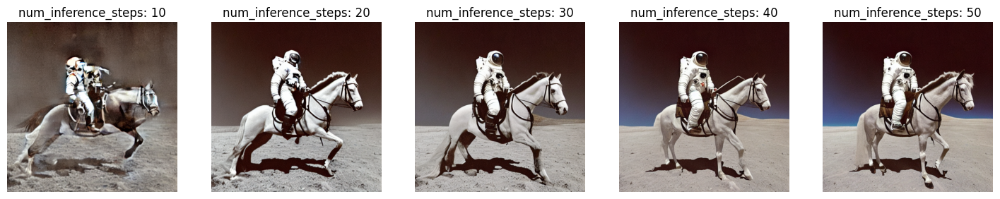

In [18]:
import matplotlib.pyplot as plt
plt.figure(figsize=(18, 8))
seed = 777
for i in range(1, 6):
  n_steps = i * 10
  generator = torch.Generator('cuda').manual_seed(seed)
  img = pipe(prompt=prompt, num_inference_steps=n_steps, generator=generator).images[0]
  plt.subplot(1, 5, i)
  plt.title(f'num_inference_steps: {n_steps}')
  plt.imshow(img)
  plt.axis('off')
plt.show()

# Parameters: guidance scale
preferred value: between 7 and 8.5

  0%|          | 0/50 [00:00<?, ?it/s]

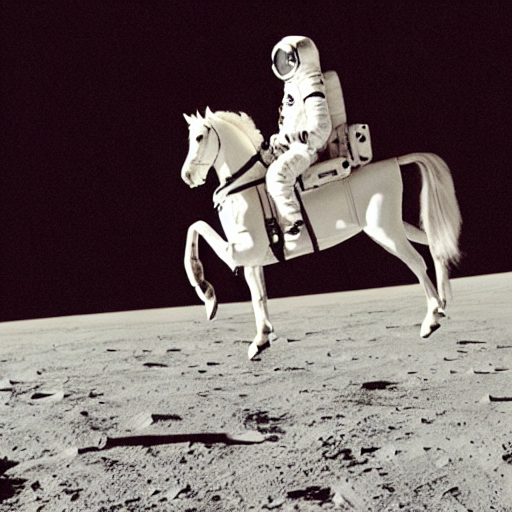

In [20]:
prompt = "a photograph of an astronaut riding a horse"
seed = 777
generator = torch.Generator('cuda').manual_seed(seed)
img = pipe(prompt=prompt, guidance_scale=10, generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

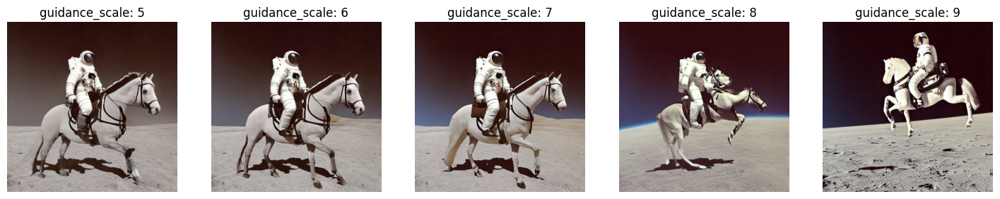

In [21]:
plt.figure(figsize=(18, 8))
for i in range(1, 6):
  n_guidance = i + 4
  generator = torch.Generator('cuda').manual_seed(seed)
  img = pipe(prompt=prompt, guidance_scale=n_guidance, generator=generator).images[0]
  plt.subplot(1, 5, i)
  plt.title(f'guidance_scale: {n_guidance}')
  plt.imshow(img)
  plt.axis('off')
plt.show()

# Parameter: image size
default: 512 x 512. Less than 512 will result lower quality images. Exceeding 512 may repeat areas of image.

  0%|          | 0/50 [00:00<?, ?it/s]

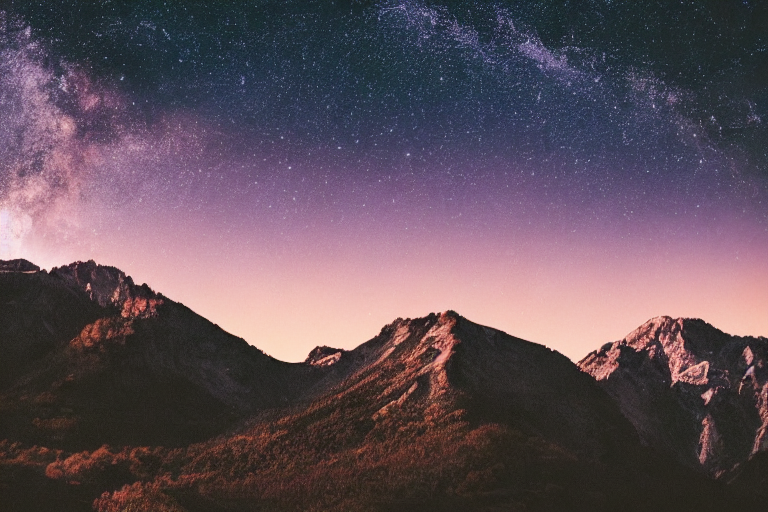

In [23]:
seed = 777
prompt = "photograph of a mountain landscape during sunset, stars in the sky"
generator = torch.Generator('cuda').manual_seed(seed)
h, w = 512, 768
img = pipe(prompt=prompt, height=h, width=w, generator=generator).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

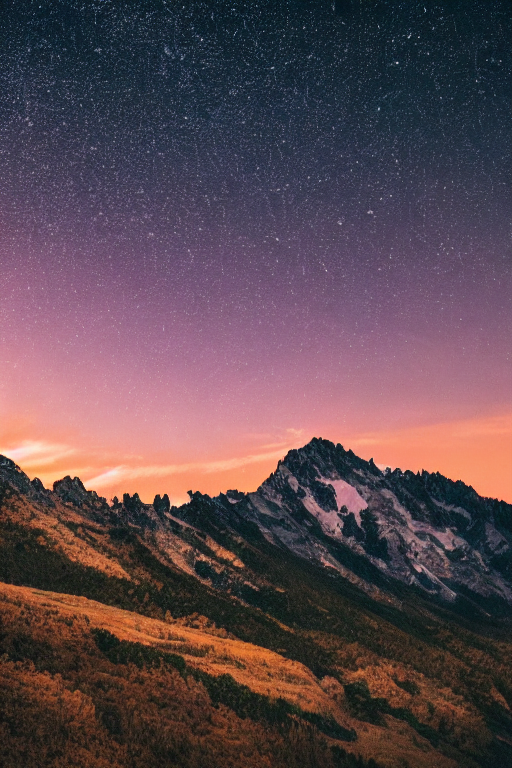

In [24]:
seed = 777
prompt = "photograph of a mountain landscape during sunset, stars in the sky"
generator = torch.Generator('cuda').manual_seed(seed)
h, w = 768, 512
img = pipe(prompt=prompt, height=h, width=w, generator=generator).images[0]
img

# Parameters: negative prompts

  0%|          | 0/50 [00:00<?, ?it/s]

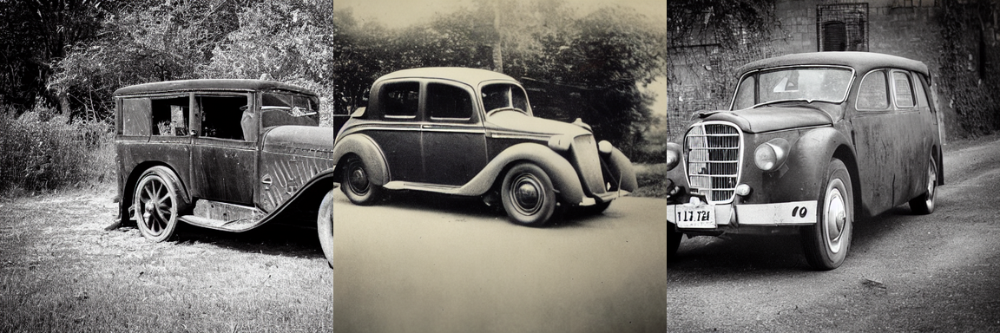

In [26]:
num_imgs = 3
prompt = "photograph of an old car"
imgs = pipe(prompt=prompt, num_images_per_prompt=num_imgs).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

In [ ]:
num_imgs = 3
prompt = "photograph of an old car"
neg_prompt = 'bw photo'
imgs = pipe(prompt=prompt, negative_prompt=neg_prompt, num_images_per_prompt=num_imgs).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

# other models: Modern Disney style

In [ ]:
!pip install diffusers==0.11.1
!pip install -q transformers ftfy accelerate bitsandbytes==0.35.0 safetensors xformers scipy

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
disney_pipe = StableDiffusionPipeline.from_pretrained("nitrosocke/mo-di-diffusion", torch_dtype=torch.float16)
disney_pipe = disney_pipe.to('cuda')
disney_pipe.enable_attention_slicing()
disney_pipe.enable_xformers_memory_efficient_attention()

In [8]:
from PIL import Image

def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows*cols
  w, h = imgs[0].size
  w, h = int(w*scale), int(h*scale)
  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size
  for i, img in enumerate(imgs):
    img = img.resize((w, h), Image.ANTIALIAS)
    grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

  0%|          | 0/50 [00:00<?, ?it/s]

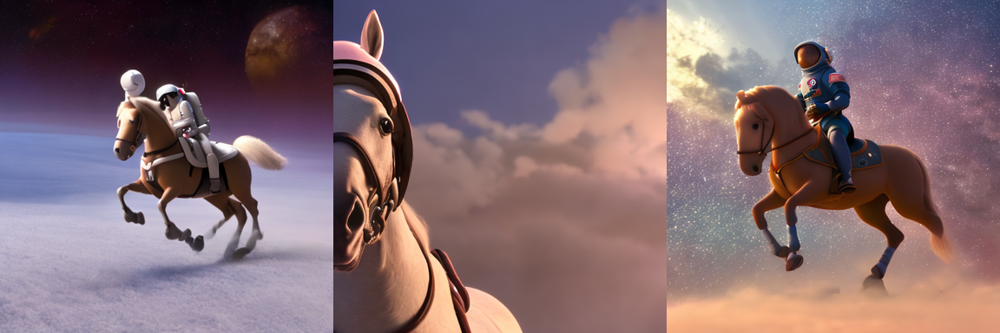

In [9]:
prompt = "a photograph of an astronaut riding a horse, modern disney style"
num_imgs = 3
seed = 777
generator = torch.Generator('cuda').manual_seed(seed)
imgs = disney_pipe(prompt=prompt, num_images_per_prompt=num_imgs, generator=generator).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

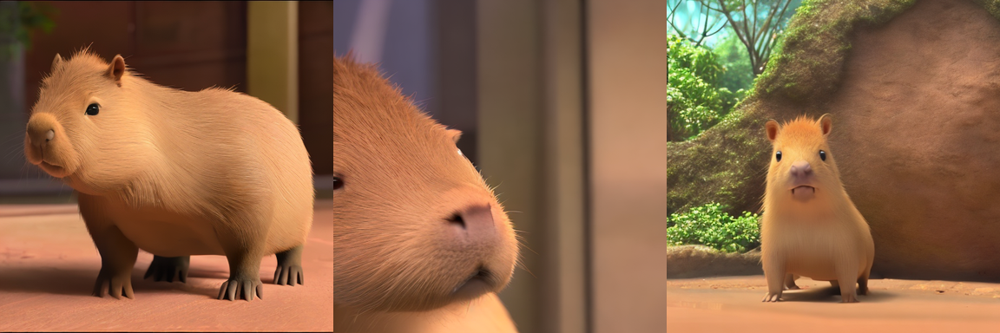

In [10]:
prompt = "capybara, modern disney style"
num_imgs = 3
seed = 777
generator = torch.Generator('cuda').manual_seed(seed)
imgs = disney_pipe(prompt=prompt, num_images_per_prompt=num_imgs, generator=generator).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

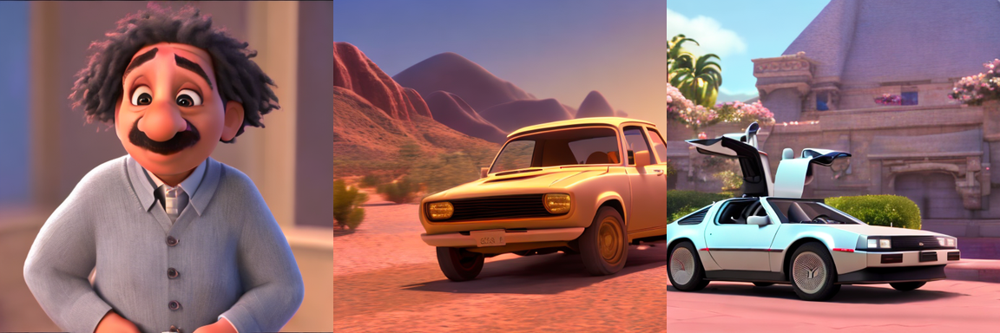

In [11]:
prompt = ["albert einstein, modern disney style",
          "modern disney style old chevette driving in the desert, golden hour",
          "modern disney style delorean"]
seed = 777
generator = torch.Generator('cuda').manual_seed(seed)
imgs = disney_pipe(prompt=prompt, generator=generator).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

# Changing the scheduler
default: PNDMScheuler

In [12]:
disney_pipe.scheduler

PNDMScheduler {
  "_class_name": "PNDMScheduler",
  "_diffusers_version": "0.11.1",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "trained_betas": null
}

In [13]:
disney_pipe.scheduler.config

FrozenDict([('num_train_timesteps', 1000),
            ('beta_start', 0.00085),
            ('beta_end', 0.012),
            ('beta_schedule', 'scaled_linear'),
            ('trained_betas', None),
            ('skip_prk_steps', True),
            ('set_alpha_to_one', False),
            ('prediction_type', 'epsilon'),
            ('steps_offset', 1),
            ('_class_name', 'PNDMScheduler'),
            ('_diffusers_version', '0.11.1'),
            ('clip_sample', False)])

  0%|          | 0/50 [00:00<?, ?it/s]

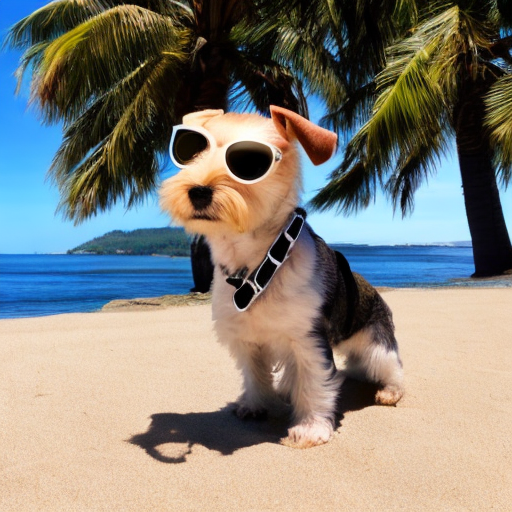

In [14]:
seed = 777
prompt = "a photo of a terrier wearing sunglasses, on the beach, ocean in the background"
generator = torch.Generator('cuda').manual_seed(seed)
img = disney_pipe(prompt=prompt, generator=generator).images[0]
img

In [15]:
disney_pipe.scheduler.compatibles

[diffusers.schedulers.scheduling_euler_discrete.EulerDiscreteScheduler,
 diffusers.schedulers.scheduling_ddpm.DDPMScheduler,
 diffusers.schedulers.scheduling_pndm.PNDMScheduler,
 diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler,
 diffusers.schedulers.scheduling_lms_discrete.LMSDiscreteScheduler,
 diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler,
 diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler]

In [16]:
from diffusers import DDIMScheduler
disney_pipe.scheduler = DDIMScheduler.from_config(disney_pipe.scheduler.config)

  0%|          | 0/50 [00:00<?, ?it/s]

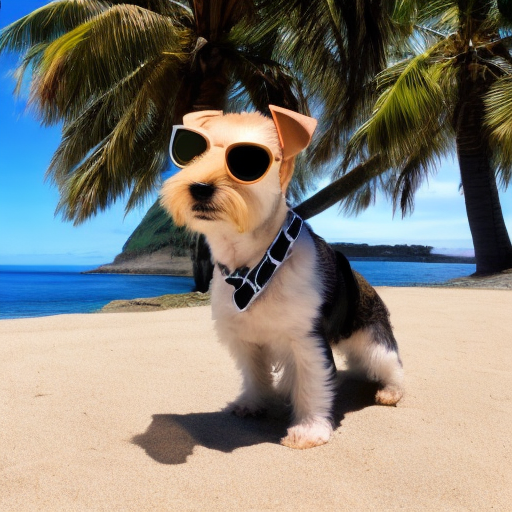

In [17]:
seed = 777
prompt = "a photo of a terrier wearing sunglasses, on the beach, ocean in the background"
generator = torch.Generator('cuda').manual_seed(seed)
img = disney_pipe(prompt=prompt, generator=generator).images[0]
img